# Face Attribute Editing Demo Notebook

This notebook demonstrates controllable facial attribute editing using
semantic directions learned in the latent space of a frozen Stable
Diffusion VAE.

## 1. Environment Setup

In [1]:
# Run only if environment does not already have these packages.
# After installing, restart the notebook kernel.

# %pip install torch torchvision diffusers transformers accelerate safetensors matplotlib tqdm numpy pillow

## 2. Project Paths

The notebook lives in `notebooks/`, while the Python package lives
in `src/`. Added the source directory to Python's import path.

In [2]:
import sys
from pathlib import Path


NOTEBOOK_DIR = Path.cwd().resolve()

# notebooks/ is directly inside the project root
PROJECT_ROOT = NOTEBOOK_DIR.parent

SRC_DIR = PROJECT_ROOT / "src"


if str(SRC_DIR) not in sys.path:
    sys.path.insert(
        0,
        str(SRC_DIR),
    )


print("Notebook directory :", NOTEBOOK_DIR)
print("Project root       :", PROJECT_ROOT)
print("Source directory   :", SRC_DIR)

print(
    "latent_editing found:",
    (SRC_DIR / "latent_editing").exists(),
)

Notebook directory : /Users/jishilin/Desktop/columbia_ms/dlcv/face/codes/notebooks
Project root       : /Users/jishilin/Desktop/columbia_ms/dlcv/face/codes
Source directory   : /Users/jishilin/Desktop/columbia_ms/dlcv/face/codes/src
latent_editing found: True


## 3. Imports

In [3]:
import os

import matplotlib.pyplot as plt
import pandas as pd
import torch

from torch.utils.data import DataLoader


from latent_editing.config import (
    Config,
    set_seed,
)

from latent_editing.data import (
    load_celeba,
    precompute_and_save_latents,
    load_precomputed_latents,
    make_latent_loaders,
)

from latent_editing.model import (
    load_vae,
    train_probe,
    evaluate_probe,
)

from latent_editing.editing import (
    demo_edit,
    edit_latent,
    decode_from_latent,
    combine_directions,
    show_image_grid,
)

## 4. Configuration

Experiments use:

- 128 × 128 CelebA images
- 2,000 training latents
- 200 validation latents
- Stable Diffusion VAE `stabilityai/sd-vae-ft-mse`
- latent scaling factor 0.18215
- linear probes trained for 10 epochs
- batch size 64
- learning rate 1e-3

In [4]:
# ---------------------------------------------------------
# Project paths
# ---------------------------------------------------------

DATA_ROOT = PROJECT_ROOT / "data"

LATENTS_FILE = (
    DATA_ROOT
    / "processed"
    / "celeba_sdvae_latents.pt"
)

CHECKPOINT_DIR = (
    PROJECT_ROOT
    / "checkpoints"
)

RESULTS_DIR = (
    PROJECT_ROOT
    / "results"
)


# Create generated-output directories if needed
LATENTS_FILE.parent.mkdir(
    parents=True,
    exist_ok=True,
)

CHECKPOINT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

RESULTS_DIR.mkdir(
    parents=True,
    exist_ok=True,
)


# ---------------------------------------------------------
# Configuration
# ---------------------------------------------------------

cfg = Config(
    data_root=str(DATA_ROOT),
    latents_file=str(LATENTS_FILE),
    checkpoint_dir=str(CHECKPOINT_DIR),
)


set_seed(cfg.seed)


# ---------------------------------------------------------
# Verify paths
# ---------------------------------------------------------

print("Device         :", cfg.device)
print("Data root      :", cfg.data_root)
print("Latents file   :", cfg.latents_file)
print("Checkpoint dir :", cfg.checkpoint_dir)
print("Results dir    :", RESULTS_DIR)

print()
print("CelebA exists  :", (DATA_ROOT / "celeba").exists())
print("Latents exist  :", LATENTS_FILE.exists())

Device         : cpu
Data root      : /Users/jishilin/Desktop/columbia_ms/dlcv/face/codes/data
Latents file   : /Users/jishilin/Desktop/columbia_ms/dlcv/face/codes/data/processed/celeba_sdvae_latents.pt
Checkpoint dir : /Users/jishilin/Desktop/columbia_ms/dlcv/face/codes/checkpoints
Results dir    : /Users/jishilin/Desktop/columbia_ms/dlcv/face/codes/results

CelebA exists  : True
Latents exist  : True


## 5. Load the Frozen Stable Diffusion VAE

The Stable Diffusion VAE is used only as a feature encoder and image
decoder. Its parameters are frozen and are not fine-tuned.

In [15]:
vae = load_vae(cfg)

Loading VAE: stabilityai/sd-vae-ft-mse


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/huggingface_hub/utils/_validators.py:208: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


Loaded VAE on: cpu
Latent channels: 4


## 6. Load CelebA

CelebA provides face images together with 40 binary facial attributes.
These labels are used to train the individual linear probes.

In [16]:
(train_dataset, val_dataset, attr_names,attr_to_idx) =  load_celeba(cfg,download=False)

print("Training images   :", len(train_dataset))
print("Validation images :", len(val_dataset))
print("Number attributes :", len(attr_names))

Training images   : 162770
Validation images : 19867
Number attributes : 41


In [17]:
print(attr_names)

['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young', '']


## 7. Precompute VAE Latents

Encoding through the VAE is the expensive portion of the pipeline.

We therefore encode a subset of CelebA once and save:

- `z_train`: training VAE latents
- `y_train`: training attribute vectors
- `z_val`: validation VAE latents
- `y_val`: validation attribute vectors

The subsequent probe experiments operate entirely on these
precomputed latent representations.

In [18]:
latents_path = Path(cfg.latents_file)


if not latents_path.exists():
    print("No precomputed latent file found.")

    precompute_and_save_latents(train_dataset=train_dataset,
                                val_dataset=val_dataset, vae=vae,
                                attr_names=attr_names, cfg=cfg)

else:
    print("Using existing latent file:")
    print(latents_path)

Using existing latent file:
/Users/jishilin/Desktop/columbia_ms/dlcv/face/codes/celeba_sdvae_latents.pt


## 8. Load Precomputed Latents

In [19]:
(z_train, y_train, z_val, y_val, attr_names, attr_to_idx) = load_precomputed_latents(cfg.latents_file)


print("z_train:", z_train.shape)

print("y_train:", y_train.shape)

print("z_val:", z_val.shape)

print("y_val:", y_val.shape)

z_train: torch.Size([2000, 4, 16, 16])
y_train: torch.Size([2000, 40])
z_val: torch.Size([200, 4, 16, 16])
y_val: torch.Size([200, 40])


In [20]:
latent_dim = z_train[0].numel()

print("Flattened latent dimension:", latent_dim)

Flattened latent dimension: 1024


# 9. Train Linear Attribute Probes

A separate binary linear probe is trained for each facial attribute.

For a flattened latent vector \(z\), each probe learns

$$f(z) = \sigma(w^T z + b)$$

The normalized weight vector \(w\) is then interpreted as the semantic
direction associated with that attribute.

In [21]:
ATTRIBUTES = ["Smiling", "Eyeglasses", "Young", "Receding_Hairline"]

probes = {}
directions = {}
validation_accuracies = {}

In [22]:
for attribute in ATTRIBUTES:

    print()
    print("=" * 70)
    print(f"Training probe for: {attribute}")
    print("=" * 70)

    probe, direction = train_probe(
        attr_name=attribute,
        z_train=z_train,
        y_train=y_train,
        z_val=z_val,
        y_val=y_val,
        attr_to_idx=attr_to_idx,
        cfg=cfg,
    )

    probes[attribute] = probe

    directions[attribute] = (direction.cpu())

    # Build validation loader so we can
    # record the final accuracy.
    _, val_loader = make_latent_loaders(
        attr_name=attribute,
        z_train=z_train,
        y_train=y_train,
        z_val=z_val,
        y_val=y_val,
        attr_to_idx=attr_to_idx,
        cfg=cfg,
    )

    accuracy = evaluate_probe(
        probe,
        val_loader,
        cfg.device,
    )

    validation_accuracies[
        attribute
    ] = accuracy


Training probe for: Smiling

Preparing loaders for Smiling (attribute index 31)
Train latents: 2000
Validation latents: 200
[Smiling] flattened latent dimension: 1024


[Smiling] Epoch 1/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 1: loss=0.6370 | val_acc=0.7150


[Smiling] Epoch 2/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 2: loss=0.5096 | val_acc=0.7550


[Smiling] Epoch 3/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 3: loss=0.4429 | val_acc=0.7950


[Smiling] Epoch 4/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 4: loss=0.4014 | val_acc=0.7950


[Smiling] Epoch 5/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 5: loss=0.3718 | val_acc=0.7550


[Smiling] Epoch 6/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 6: loss=0.3482 | val_acc=0.7900


[Smiling] Epoch 7/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 7: loss=0.3315 | val_acc=0.8050


[Smiling] Epoch 8/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 8: loss=0.3135 | val_acc=0.7950


[Smiling] Epoch 9/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 9: loss=0.3009 | val_acc=0.8000


[Smiling] Epoch 10/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Smiling] Epoch 10: loss=0.2922 | val_acc=0.8100

Preparing loaders for Smiling (attribute index 31)
Train latents: 2000
Validation latents: 200

Training probe for: Eyeglasses

Preparing loaders for Eyeglasses (attribute index 15)
Train latents: 2000
Validation latents: 200
[Eyeglasses] flattened latent dimension: 1024


[Eyeglasses] Epoch 1/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 1: loss=0.3095 | val_acc=0.9050


[Eyeglasses] Epoch 2/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 2: loss=0.2091 | val_acc=0.9050


[Eyeglasses] Epoch 3/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 3: loss=0.1840 | val_acc=0.9050


[Eyeglasses] Epoch 4/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 4: loss=0.1626 | val_acc=0.9200


[Eyeglasses] Epoch 5/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 5: loss=0.1465 | val_acc=0.9200


[Eyeglasses] Epoch 6/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 6: loss=0.1297 | val_acc=0.9200


[Eyeglasses] Epoch 7/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 7: loss=0.1190 | val_acc=0.9200


[Eyeglasses] Epoch 8/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 8: loss=0.1081 | val_acc=0.9250


[Eyeglasses] Epoch 9/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 9: loss=0.0994 | val_acc=0.9250


[Eyeglasses] Epoch 10/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Eyeglasses] Epoch 10: loss=0.0921 | val_acc=0.9350

Preparing loaders for Eyeglasses (attribute index 15)
Train latents: 2000
Validation latents: 200

Training probe for: Young

Preparing loaders for Young (attribute index 39)
Train latents: 2000
Validation latents: 200
[Young] flattened latent dimension: 1024


[Young] Epoch 1/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 1: loss=0.5352 | val_acc=0.7450


[Young] Epoch 2/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 2: loss=0.4651 | val_acc=0.7450


[Young] Epoch 3/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 3: loss=0.4351 | val_acc=0.7650


[Young] Epoch 4/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 4: loss=0.4094 | val_acc=0.7550


[Young] Epoch 5/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 5: loss=0.3943 | val_acc=0.7700


[Young] Epoch 6/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 6: loss=0.3784 | val_acc=0.8100


[Young] Epoch 7/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 7: loss=0.3696 | val_acc=0.7950


[Young] Epoch 8/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 8: loss=0.3557 | val_acc=0.7900


[Young] Epoch 9/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 9: loss=0.3465 | val_acc=0.8000


[Young] Epoch 10/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Young] Epoch 10: loss=0.3359 | val_acc=0.8250

Preparing loaders for Young (attribute index 39)
Train latents: 2000
Validation latents: 200

Training probe for: Receding_Hairline

Preparing loaders for Receding_Hairline (attribute index 28)
Train latents: 2000
Validation latents: 200
[Receding_Hairline] flattened latent dimension: 1024


[Receding_Hairline] Epoch 1/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 1: loss=0.2997 | val_acc=0.9200


[Receding_Hairline] Epoch 2/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 2: loss=0.2395 | val_acc=0.9200


[Receding_Hairline] Epoch 3/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 3: loss=0.2213 | val_acc=0.9200


[Receding_Hairline] Epoch 4/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 4: loss=0.2077 | val_acc=0.9200


[Receding_Hairline] Epoch 5/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 5: loss=0.1941 | val_acc=0.9200


[Receding_Hairline] Epoch 6/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 6: loss=0.1830 | val_acc=0.9150


[Receding_Hairline] Epoch 7/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 7: loss=0.1752 | val_acc=0.9150


[Receding_Hairline] Epoch 8/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 8: loss=0.1671 | val_acc=0.9150


[Receding_Hairline] Epoch 9/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 9: loss=0.1602 | val_acc=0.9200


[Receding_Hairline] Epoch 10/10:   0%|          | 0/32 [00:00<?, ?it/s]

[Receding_Hairline] Epoch 10: loss=0.1539 | val_acc=0.9200

Preparing loaders for Receding_Hairline (attribute index 28)
Train latents: 2000
Validation latents: 200


## 10. Probe Performance

In [23]:
results_df = pd.DataFrame(
    [
        {
            "Attribute": attribute,
            "Validation Accuracy": accuracy,
        }
        for attribute, accuracy
        in validation_accuracies.items()
    ]
)


results_df["Validation Accuracy"] = results_df["Validation Accuracy"].round(3)

results_df

,Attribute,Validation Accuracy
0,Smiling,0.810
1,Eyeglasses,0.935
2,Young,0.825
3,Receding_Hairline,0.920


# 11. Single-Attribute Editing

Given a latent representation $z$ and a normalized semantic direction
$d$, editing is performed with

$$z' = z + \alpha d$$

where $\alpha$ controls the magnitude and sign of the edit.

## Smiling

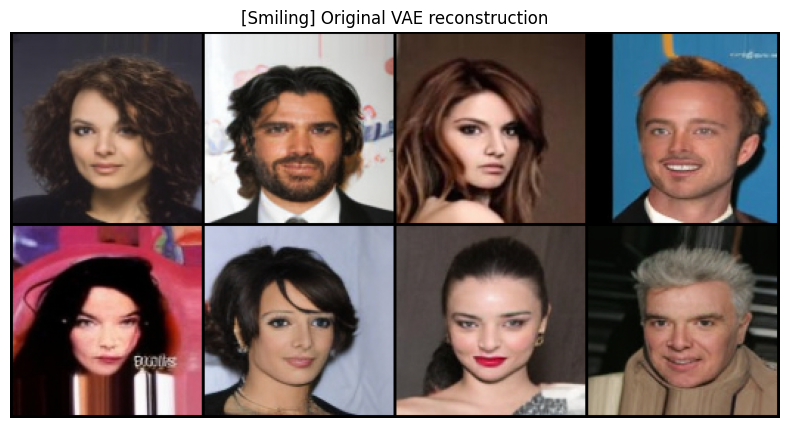

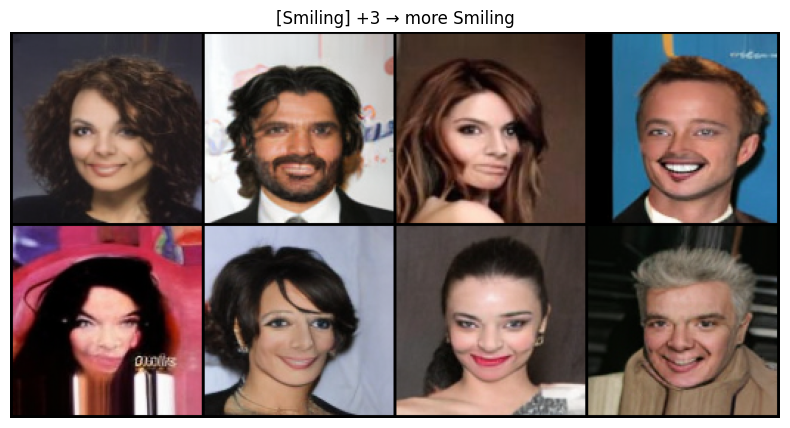

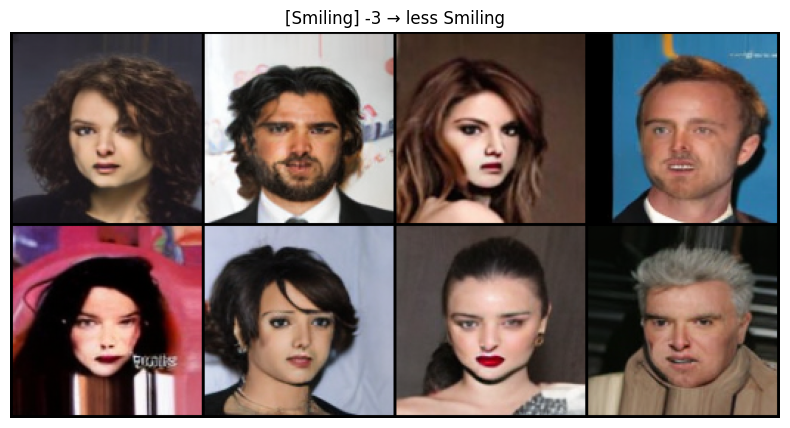

In [24]:
demo_edit(
    z_val=z_val,
    direction=directions["Smiling"],
    vae=vae,
    cfg=cfg,
    attribute_name="Smiling",
    alpha=3.0,
)

In [25]:
## Eyeglasses

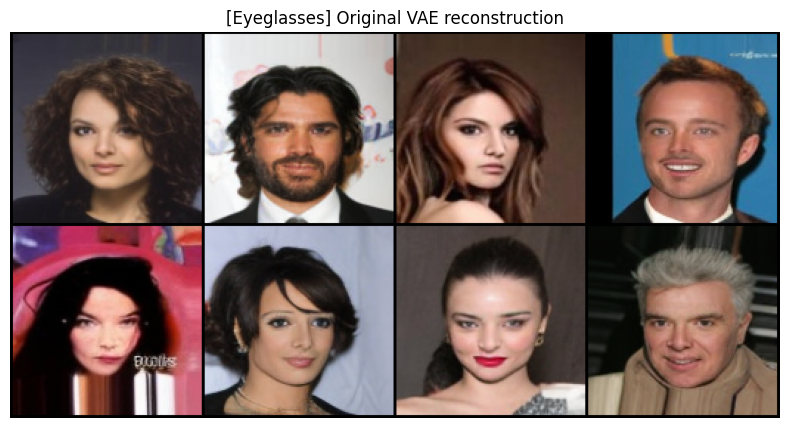

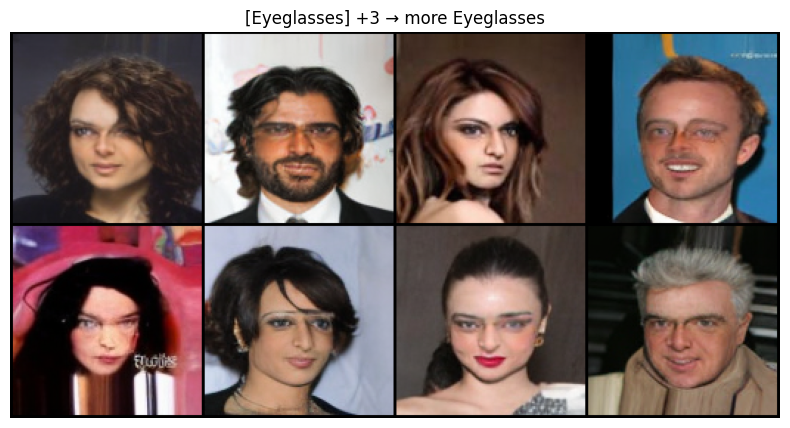

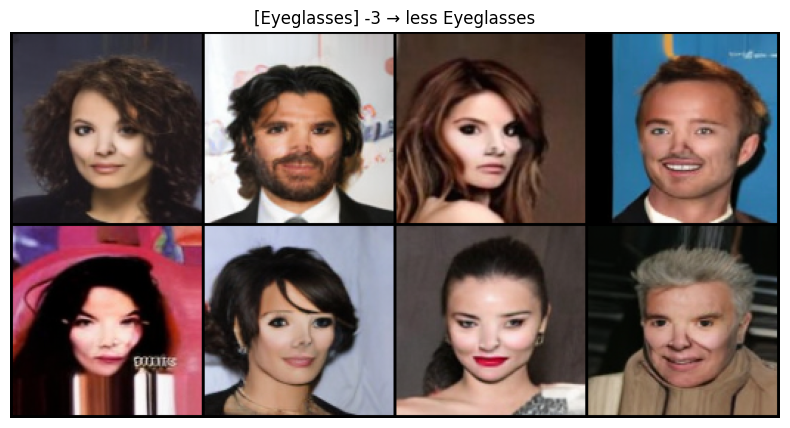

In [26]:
demo_edit(
    z_val=z_val,
    direction=directions["Eyeglasses"],
    vae=vae,
    cfg=cfg,
    attribute_name="Eyeglasses",
    alpha=3.0,
)

## Young

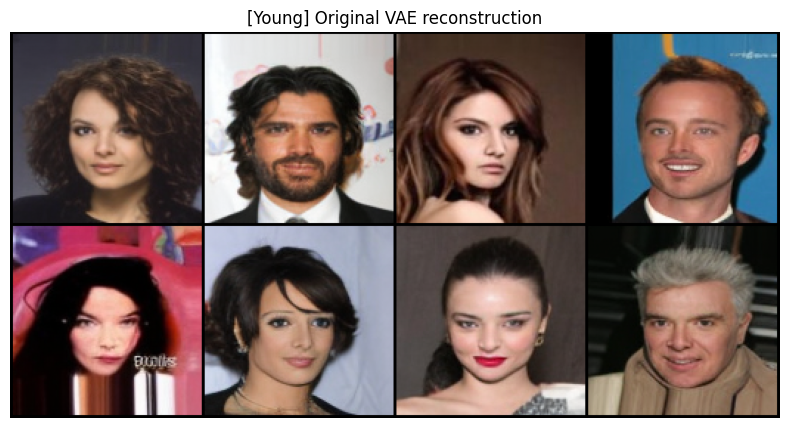

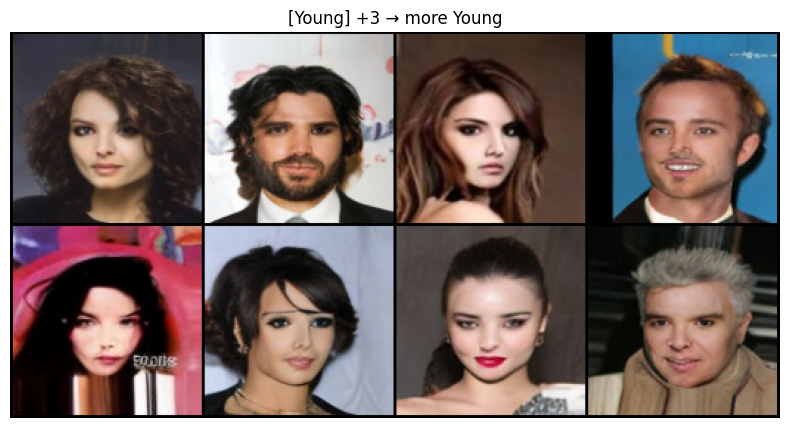

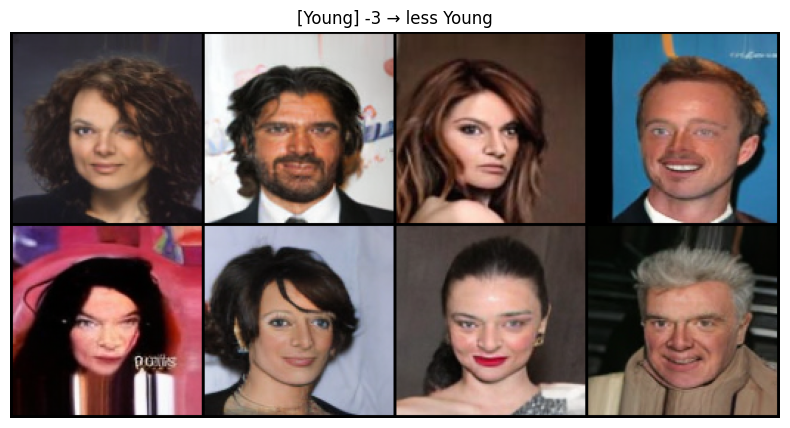

In [27]:
demo_edit(
    z_val=z_val,
    direction=directions["Young"],
    vae=vae,
    cfg=cfg,
    attribute_name="Young",
    alpha=3.0,
)

## Receding Hairline

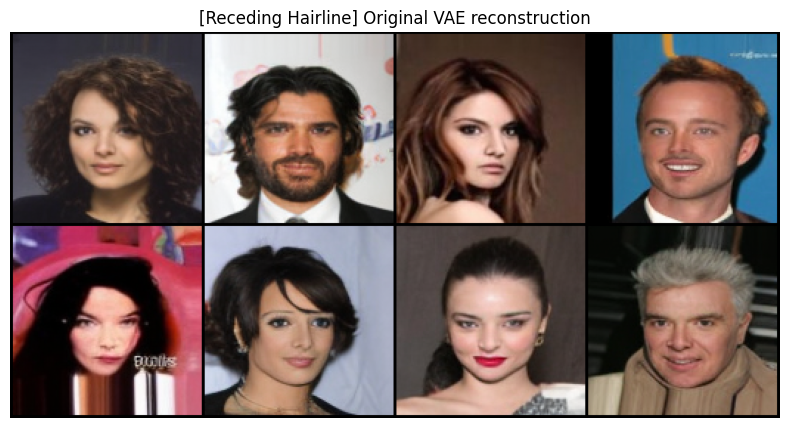

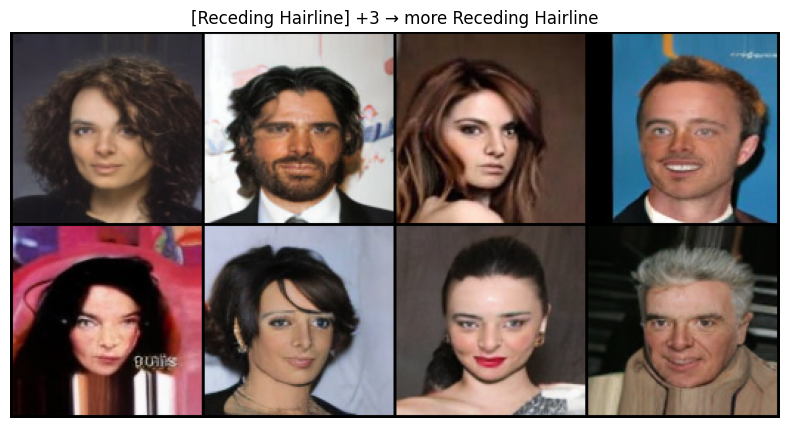

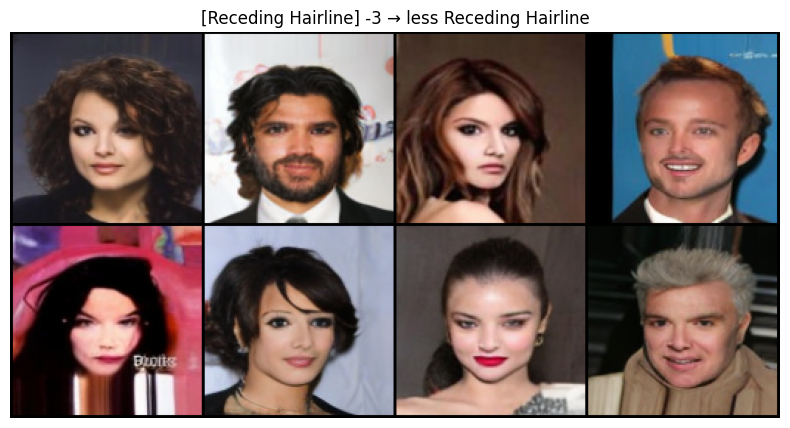

In [28]:
demo_edit(
    z_val=z_val,
    direction=directions["Receding_Hairline"],
    vae=vae,
    cfg=cfg,
    attribute_name="Receding Hairline",
    alpha=3.0,
)

# 12. Edit Strength

Because editing is performed continuously in latent space, the same
attribute can be applied with different values of $\alpha$.

This allows us to inspect how the decoded face changes as we move farther
along the learned semantic direction.

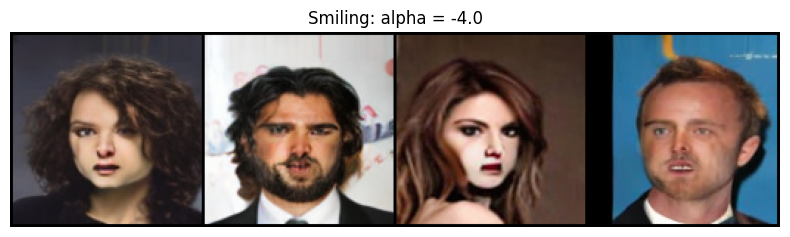

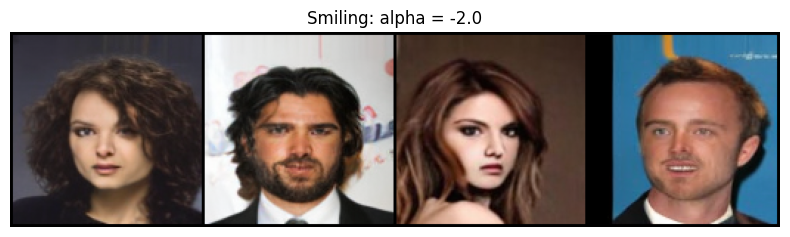

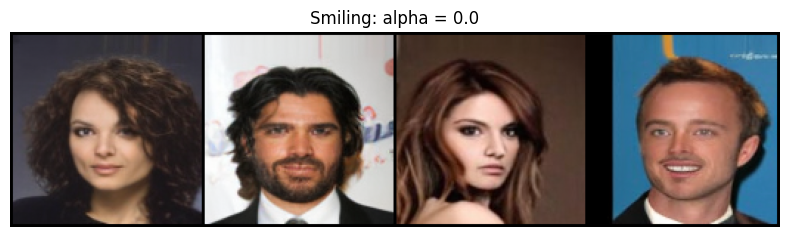

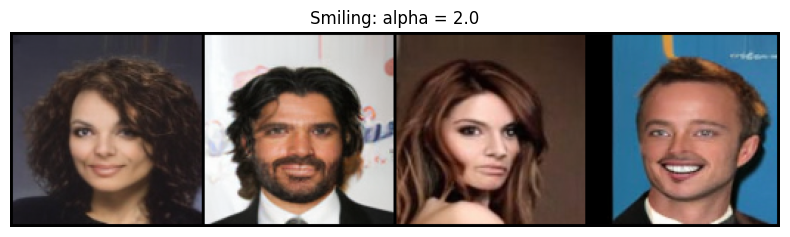

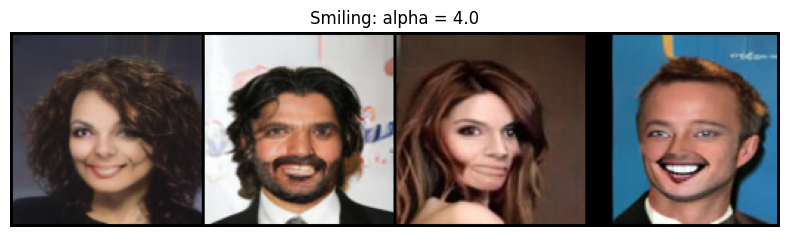

In [29]:
attribute = "Smiling"

alphas = [-4.0, -2.0, 0.0, 2.0, 4.0]


num_examples = 4

z_examples = (z_val[:num_examples].clone())


for alpha in alphas:

    if alpha == 0:
        z_edited = z_examples

    else:
        z_edited = edit_latent(
            z=z_examples,
            direction=directions[
                attribute
            ],
            alpha=alpha,
        )

    decoded = decode_from_latent(
        z=z_edited,
        vae=vae,
        latent_scale=cfg.latent_scale,
    )

    show_image_grid(
        decoded,
        nrow=num_examples,
        title=(
            f"{attribute}: "
            f"alpha = {alpha}"
        ),
    )

# 13. Multi-Attribute Editing

Because the independently learned attribute directions occupy the same
latent space, they can be combined through linear superposition.

Here we combine:

- Smiling
- Eyeglasses
- Young

into a single semantic direction.

In [30]:
combo_weights = {
    "Smiling": 1.0,
    "Eyeglasses": 0.7,
    "Young": 0.8,
}


combo_direction = combine_directions(
    directions=directions,
    weights=combo_weights,
)


print(
    "Combined direction norm:",
    combo_direction.norm().item(),
)

Combined direction norm: 1.0


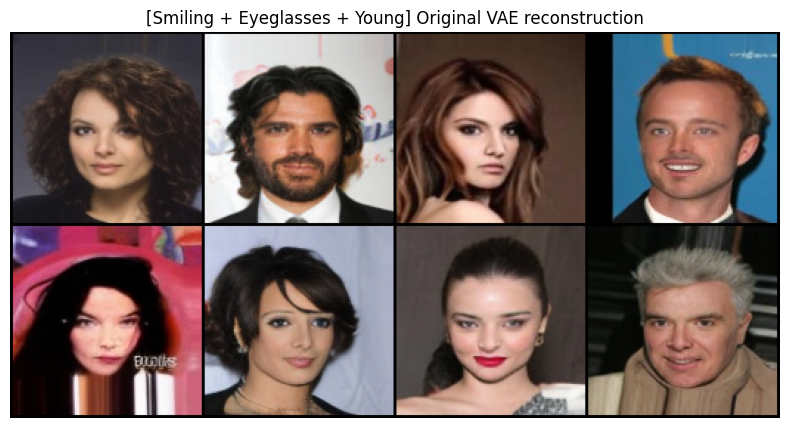

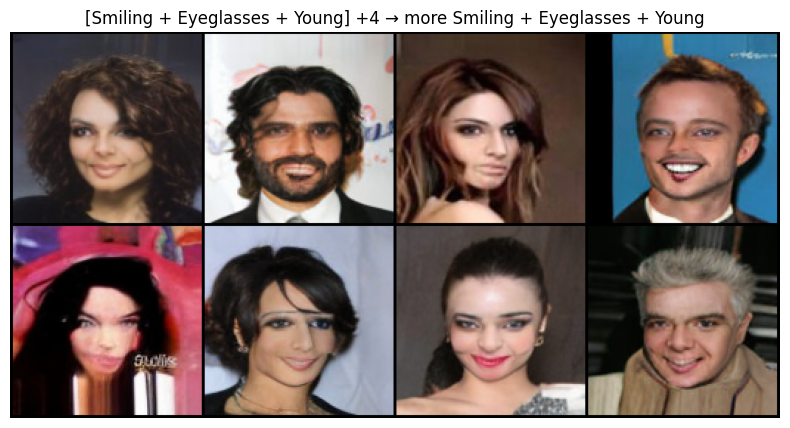

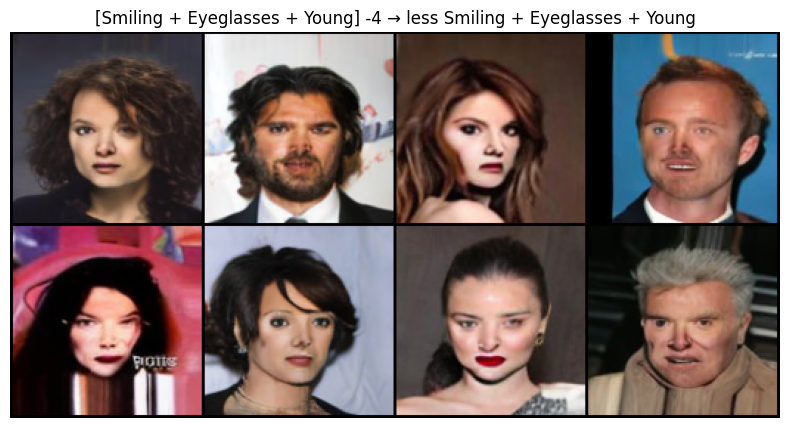

In [31]:
demo_edit(
    z_val=z_val,
    direction=combo_direction,
    vae=vae,
    cfg=cfg,
    attribute_name=(
        "Smiling + Eyeglasses + Young"
    ),
    alpha=cfg.edit_step_scale,
)

## 14. Compare Original and Combined Edit

The combined direction applies multiple semantic changes with a single
latent update before decoding.

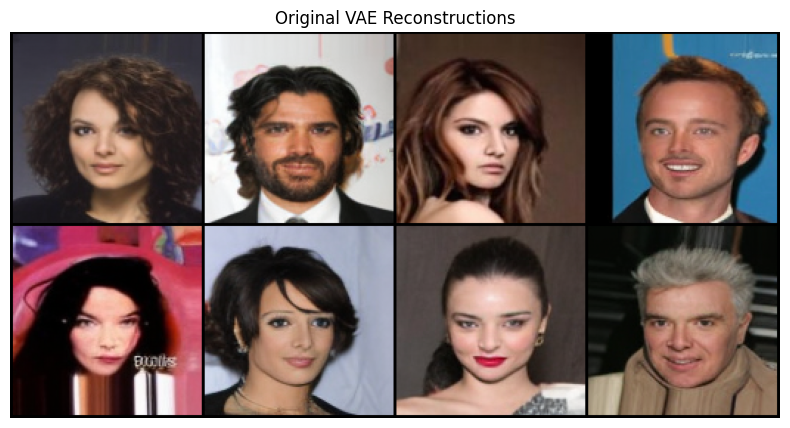

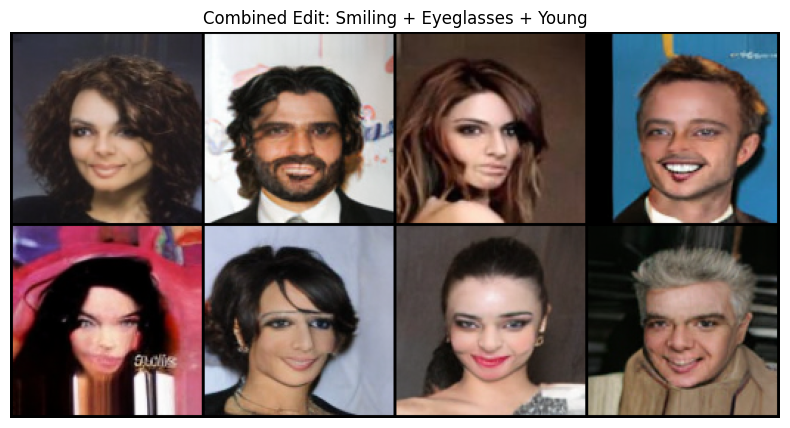

In [32]:
num_examples = min(
    8,
    z_val.shape[0],
)


z_original = (
    z_val[:num_examples]
    .clone()
)


z_combined = edit_latent(
    z=z_original,
    direction=combo_direction,
    alpha=cfg.edit_step_scale,
)


x_original = decode_from_latent(
    z=z_original,
    vae=vae,
    latent_scale=cfg.latent_scale,
)


x_combined = decode_from_latent(
    z=z_combined,
    vae=vae,
    latent_scale=cfg.latent_scale,
)


show_image_grid(
    x_original,
    nrow=4,
    title=(
        "Original VAE Reconstructions"
    ),
)


show_image_grid(
    x_combined,
    nrow=4,
    title=(
        "Combined Edit: "
        "Smiling + Eyeglasses + Young"
    ),
)

# 15. Save Trained Probes and Semantic Directions

The trained probes and derived semantic directions can be reused without
retraining the classifiers.

In [33]:
checkpoint_dir = Path(
    cfg.checkpoint_dir
)

checkpoint_dir.mkdir(
    parents=True,
    exist_ok=True,
)


for attribute, probe in probes.items():

    safe_name = attribute.lower()

    probe_path = (
        checkpoint_dir
        / f"probe_{safe_name}.pth"
    )

    direction_path = (
        checkpoint_dir
        / f"direction_{safe_name}.pt"
    )

    torch.save(
        probe.state_dict(),
        probe_path,
    )

    torch.save(
        directions[attribute].cpu(),
        direction_path,
    )

    print(
        f"Saved {attribute}"
    )

Saved Smiling
Saved Eyeglasses
Saved Young
Saved Receding_Hairline


In [34]:
combo_path = (
    checkpoint_dir
    / "direction_smiling_eyeglasses_young.pt"
)


torch.save(
    combo_direction.cpu(),
    combo_path,
)


print(
    "Saved combined direction to:",
    combo_path,
)

Saved combined direction to: /Users/jishilin/Desktop/columbia_ms/dlcv/face/codes/checkpoints/direction_smiling_eyeglasses_young.pt
